In [1]:
import os
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision import datasets
import torchextractor as tx
from torchvision import transforms as trn
from torchvision import datasets
from torch.utils.data import TensorDataset, DataLoader

import glob
import PIL
from matplotlib import image
import matplotlib.pyplot as plt 

from tqdm import tqdm
from torchsummary import summary
# from torchviz import make_dot
import copy
from sklearn.linear_model import LinearRegression
from sklearn.datasets import load_iris
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.model_selection import cross_val_score, cross_validate, KFold
from sklearn.metrics import make_scorer
import nilearn
from nilearn import plotting, masking, image
from nilearn.input_data import NiftiLabelsMasker

import pandas as pd
import string
from scipy.stats import pearsonr


/home/sungshinkim/.local/lib/python3.9/site-packages/nilearn/input_data/__init__.py:23: FutureWarning: The import path 'nilearn.input_data' is deprecated in version 0.9. Importing from 'nilearn.input_data' will be possible at least until release 0.13.0. Please import from 'nilearn.maskers' instead.
  warnings.warn(message, FutureWarning)


In [2]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(DEVICE)
stim_dir = '/home/sungshinkim/DeepProprioception/Vision_Project/Letters'
letter_paths = sorted(glob.glob(stim_dir + '/*.jpg'))

cuda


In [ ]:
RandomAffine(degrees=(30, 70), translate=(0.1, 0.3), scale=(0.5, 0.75))

In [148]:
def get_augmentation_transforms():

    augmentation_transforms = [trn.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.3),
                               trn.RandomAffine(degrees=30, translate=(0.3, 0.15),scale=(0.7, 1.2),)
#                                trn.RandomRotation(30), 
                               ]
    return augmentation_transforms

resize_normalize = [trn.Resize((224,224)),
            trn.ToTensor()]
            #trn.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])])
train_transform = \
    trn.Compose(get_augmentation_transforms() + 
                       resize_normalize)

In [149]:
def train(model, optimizer, train_loader, loss_fn, device, n_epochs):
    accuracy = []
    for epoch in tqdm(range(n_epochs)):
        total = 0
        correct = 0
        for images, labels in train_loader:
            images = images.to(device)
            labels = labels.to(device)
            
            optimizer.zero_grad()
            output = model(images)
            loss = loss_fn(output, labels)
            loss.backward()
            optimizer.step()
            
            predictions = torch.argmax(output, dim=1)
            total += len(output)
            correct += torch.sum(predictions==labels)
        accuracy.append(correct/total)
    return model, loss, accuracy

In [150]:
#g_seed = torch.Generator()
#g_seed.manual_seed(seed)
letter_datasets = datasets.ImageFolder(root=stim_dir,
                                            transform=train_transform)

train_loader = DataLoader(letter_datasets,
                                batch_size=10, shuffle=True,
                                num_workers=4)
test_loader = DataLoader(letter_datasets,
                                batch_size=10, shuffle=True,
                                num_workers=4)

In [151]:
Xa = []  # Augmented data
ya = []
for i in tqdm(range(200)):
    for a, b in train_loader:
        Xa.append(a)
        ya.append(b)
Xa = torch.cat(Xa)
ya = torch.cat(ya)

100%|██████████| 200/200 [04:42<00:00,  1.41s/it]


Traceback (most recent call last):
  File "/home/sungshinkim/anaconda3/envs/seojin/lib/python3.9/multiprocessing/queues.py", line 241, in _feed
    close()
  File "/home/sungshinkim/anaconda3/envs/seojin/lib/python3.9/multiprocessing/connection.py", line 182, in close
    self._close()
  File "/home/sungshinkim/anaconda3/envs/seojin/lib/python3.9/multiprocessing/connection.py", line 366, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor


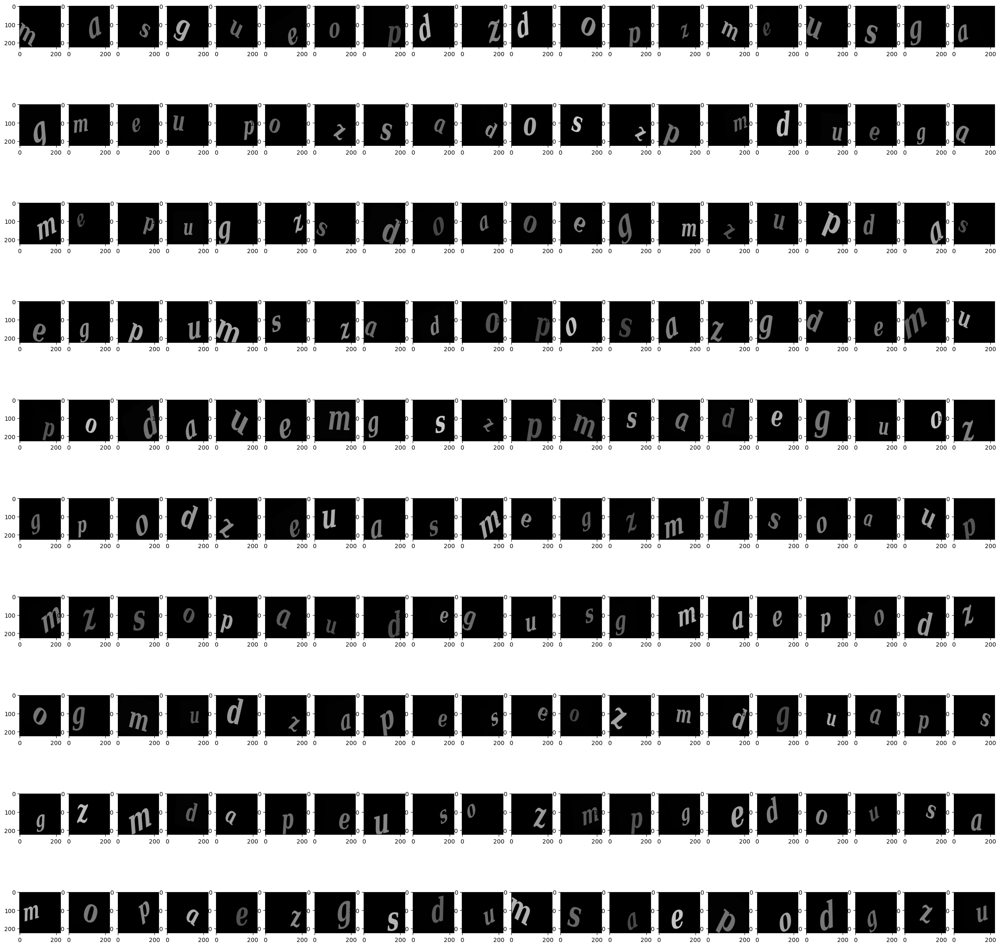

In [152]:
fig, ax = plt.subplots(figsize=(30, 30))

for d in range(200):
    plt.subplot(10,20,d+1)
    plt.imshow(Xa[d].permute(1,2,0))

In [524]:
# input_imgs = []
# for letter_file in letter_paths:
#     input_imgs.append(PIL.Image.open(letter_file))
# input_imgs_np = np.stack(input_imgs)  # sample by w by h by 3
# input_imgs = torch.tensor(input_imgs_np)
# # letter_idx = torch.arange(10) # a, d, e, g, m, o, p, s, u, z
# ds = TensorDataset(input_imgs, letter_idx)
# data_loader = DataLoader(ds, batch_size=10, shuffle=True)

In [178]:
# models = {"resnet50_random": torchvision.models.resnet50(weights=None),
#           "resnet50": torchvision.models.resnet50(weights=ResNet50_Weights.DEFAULT),}
models = {"resnet18_random": torchvision.models.resnet18(weights=None),
          "resnet18": torchvision.models.resnet18(weights='DEFAULT'),
         "vgg19_random": torchvision.models.vgg19(weights=None),
         "vgg19": torchvision.models.vgg19(weights='DEFAULT'),}

In [179]:
letter_datasets = datasets.ImageFolder(root=stim_dir, transform=trn.Compose(resize_normalize))
train_loader = DataLoader(letter_datasets,
                                batch_size=10, shuffle=False,
                                num_workers=4)


In [180]:
for X, y in train_loader:
    pass

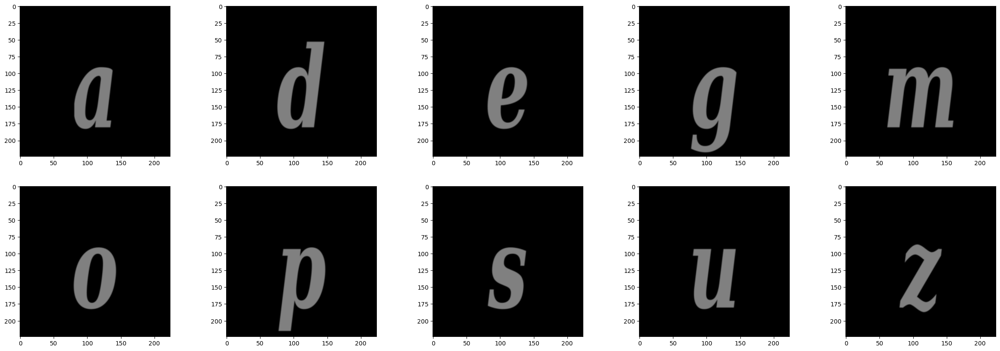

In [274]:
fig, ax = plt.subplots(figsize=(30, 10))

for d in range(10):
    plt.subplot(2,5,d+1)
    plt.imshow(X[d].permute(1,2,0))

In [172]:
vgg19 = models['vgg19']
vgg19_new = copy.deepcopy(vgg19)
resnet18 = models['resnet18']
#vgg19_new = copy.deepcopy(vgg19)

resnet18_layers = ['layer1','layer2','layer3','layer4', 'avgpool']


In [277]:
## Network response to original letter images
model = tx.Extractor(resnet18,resnet18_layers).to(DEVICE)
X = X.to(DEVICE)
resp_org = {}
for k in range(10):
    input_img = X[k].unsqueeze(0).to(DEVICE)
    model_output, img_features = model(input_img)
    for i, (layer_name, f) in enumerate(img_features.items()):
        resp_org[layer_name] =  f.data.cpu().numpy().ravel() if k==0 else \
        np.vstack((resp_org[layer_name], f.data.cpu().numpy().ravel()))

In [279]:
model = tx.Extractor(resnet18,resnet18_layers).to(DEVICE)
resp_dict = {}

#for k in tqdm(range(Xa.shape[0])):
for k in tqdm(range(Xa.shape[0])):
    input_img = Xa[k].unsqueeze(0).to(DEVICE)
    model_output, img_features = model(input_img)
    for i, (layer_name, f) in enumerate(img_features.items()):
        resp_dict[layer_name] = f.data.cpu().numpy().ravel() if k==0 else \
        np.vstack((resp_dict[layer_name], f.data.cpu().numpy().ravel()))


100%|██████████| 2000/2000 [05:56<00:00,  5.61it/s]


In [574]:
resp['layer1'].shape, resp['layer2'].shape, resp['layer3'].shape, resp['layer4'].shape, resp['avgpool'].shape

((2007040,), (1003520,), (501760,), (250880,), (5120,))

In [189]:
plt.plot(np.cumsum(pca_letter['pixel'].explained_variance_ratio_))

KeyError: 'pixel'

In [167]:
## Performing PCA
n_components = 200
seed = 2023
X_pc = {}
pca_letter = {}
for layer in resnet18_layers:
    Xr = resp_dict[layer]
#     X_scl = StandardScaler().fit_transform(Xr)
    X_scl = Xr

    pca_letter[layer] = PCA(n_components=n_components,random_state=seed).fit(X_scl)
    X_pc[layer] = pca_letter[layer].transform(X_scl)
#    plt.subplot(1,5,k+1)
#    plt.plot(np.cumsum(pca_letter[layer].explained_variance_ratio_))
tem = StandardScaler().fit_transform(Xa.view(Xa.shape[0],-1))
pca_letter['pixel'] = PCA(n_components=n_components,random_state=seed).fit(tem)
X_pc['pixel'] = pca_letter['pixel'].transform(StandardScaler().fit_transform(tem))

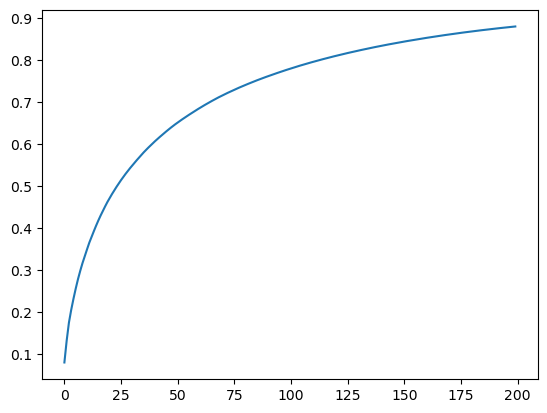

In [271]:
tem = StandardScaler().fit_transform(Xa.view(Xa.shape[0],-1))
pca_letter['pixel'] = PCA(n_components=n_components,random_state=seed).fit(tem)
plt.plot(np.cumsum(pc.explained_variance_ratio_))

/home/sungshinkim/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/sungshinkim/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/sungshinkim/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/sungshinkim/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/sungshinkim/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/sungshinkim/.local/

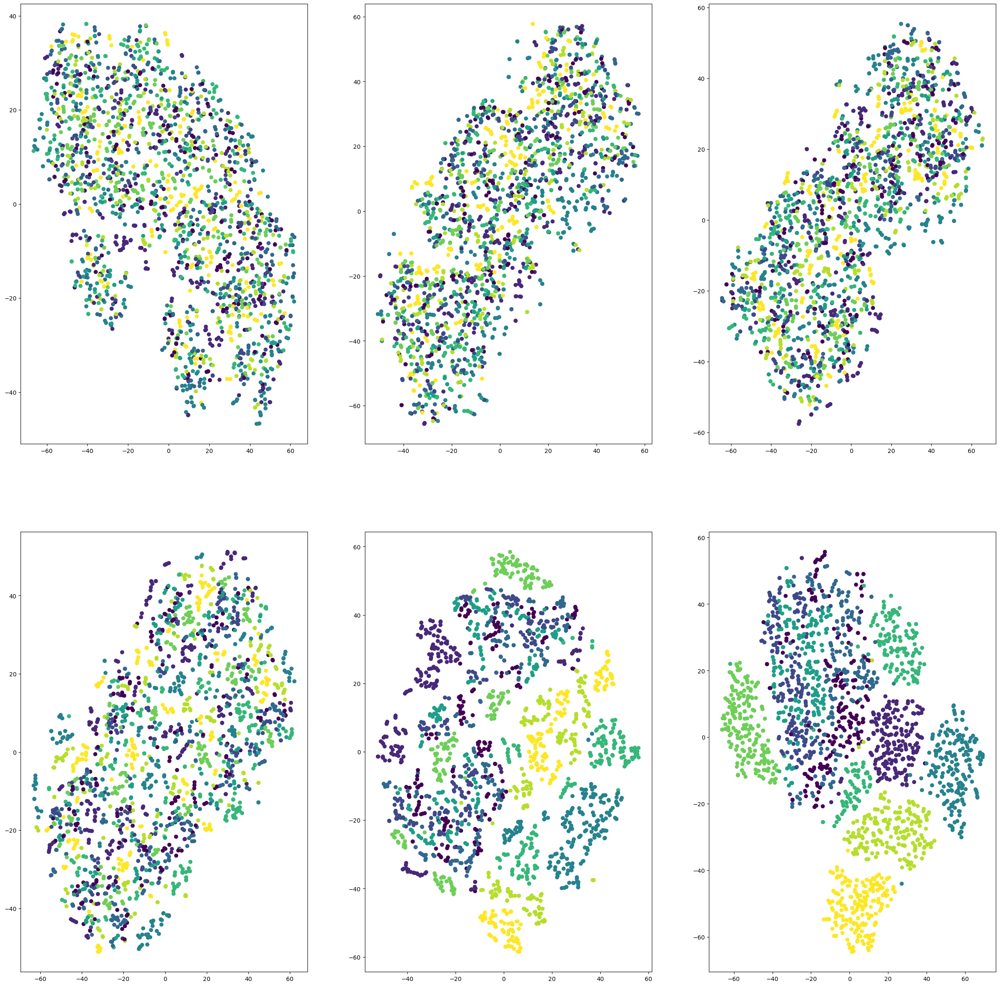

In [191]:
layers = ['pixel','layer1','layer2','layer3','layer4', 'avgpool']
fig, _ = plt.subplots(figsize=(30, 30))

for k, layer in enumerate(layers):
    plt.subplot(2,3,k+1)
    X_em[layer] = TSNE(n_components=2,learning_rate='auto').fit_transform(X_pc[layer])
    plt.scatter(X_em[layer][:,0],X_em[layer][:,1],c=ya)
    #plt.scatter(X_pc[layer][:,0],X_pc[layer][:,1], c=ya)

In [219]:
!pip install nilearn

     |████████████████████████████████| 9.6 MB 14.4 MB/s eta 0:00:01
     |████████████████████████████████| 3.3 MB 103.7 MB/s eta 0:00:01
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


In [3]:
def fast_masking(img, roi):
    ## img : data (NIFTI image)
    img_data = img.get_fdata()
    roi_mask = roi.get_fdata().astype(bool)
    if img_data.shape[:3] != roi_mask.shape[:3]:
        raise ValueError('different shape while masking! img=%s and roi=%s' % (img_data.shape, roi_mask.shape))
    ## the shape is (n_trials, n_voxels) which is to cross-validate for runs. =(n_samples, n_features)
    return img_data[roi_mask]

In [4]:
def vectorized_correlation(x,y):
    dim = 0

    centered_x = x - x.mean(axis=dim, keepdims=True)
    centered_y = y - y.mean(axis=dim, keepdims=True)

    covariance = (centered_x * centered_y).sum(axis=dim, keepdims=True)

    covariance = covariance / (x.shape[dim])

    x_std = x.std(axis=dim, keepdims=True)+1e-8
    y_std = y.std(axis=dim, keepdims=True)+1e-8

    corr = covariance / (x_std * y_std)

    return corr.ravel()

def pearson_corr(y_true, y_pred):
    corr, _ = pearsonr(y_true, y_pred)
    return corr

In [5]:
def visualize_score(score,voxel_mask,fname):
    visual_mask_3D = np.zeros((96,114,96))
    visual_mask_3D[voxel_mask==1]= score
    brain_mask = '/mnt/sdb2/DeepDraw/Projects/20220801_DP01_mri/mri/output/preprocessed/full_mask.20220801_DP01_mri.nii.gz'
    nii_save_path =  os.path.join('./'+fname+'.nii')
    saveasnii(brain_mask,nii_save_path,visual_mask_3D)
    plotting.plot_glass_brain(nii_save_path,
                            title='Voxel score (Test)',plot_abs=False,
                            display_mode='lyr',colorbar=True)
    plotting.show()
    
def saveasnii(brain_mask,nii_save_path,nii_data):
    img = nib.load(brain_mask)
    nii_img = nib.Nifti1Image(nii_data, img.affine, img.header)
    nib.save(nii_img, nii_save_path)

In [18]:
def prepare_fmridata(subj, maskname):
    mask_nii = image.load_img(maskname)
    mask_data = mask_nii.get_fdata().astype(bool)
    fname_list = glob.glob(proj_dir + subj + '/mri/output/beta/lss_beta_run_*.nii')
    data = []
    for i in range(3):
        img_nii = image.load_img(fname_list[i])
        data.append(fast_masking(img_nii, mask_nii))

    fmri_betas = np.concatenate(data,axis=1).T    
    return fmri_betas, mask_data

def prepare_conds(subj):
    cond_list = glob.glob(proj_dir + subj + '/Stimulus/*csv')
    letter_seq = []
    alphabet = set(string.ascii_letters)

    for i in range(3):
        temp = pd.read_csv(cond_list[i])['Stimulus']
        letter_seq += [letter for letter in temp if isinstance(letter, str) and letter.isalpha() and letter in alphabet]

    # create dictionary mapping unique letters to numbers
    letter_to_number = {letter: i for i, letter in enumerate(sorted(set(letter_seq)))}

    # replace each letter with its corresponding number
    letter_code = np.array([letter_to_number[letter] for letter in letter_seq])
    
    return letter_code



In [24]:
maskname = '/mnt/sdb2/DeepDraw/Projects/20220801_DP01_mri/mri/output/preprocessed/full_mask.20220801_DP01_mri.nii.gz'
proj_dir = '/mnt/sdb2/DeepDraw/Projects/'
maskdir = '/mnt/sdb2/DeepDraw/mri_mask/'
maskname = maskdir + 'fan.roi.201.nii.gz' 
maskname1 = '/mnt/sdb2/DeepDraw/Projects/20220801_DP01_mri/mri/output/preprocessed/full_mask.20220801_DP01_mri.nii.gz'

maskname = maskdir + 'mask.L_V5.nii' 


fmri_betas, mask_data = prepare_fmridata('20220801_DP01_mri', maskname)


In [34]:
lcode = prepare_conds('20220801_DP01_mri')
lcode

array([4, 2, 3, 9, 8, 0, 1, 5, 6, 7, 1, 7, 4, 6, 0, 5, 3, 9, 8, 2, 7, 4,
       0, 3, 1, 8, 9, 2, 6, 5, 6, 2, 4, 5, 0, 7, 3, 1, 9, 8, 3, 7, 9, 6,
       1, 8, 2, 0, 4, 5, 9, 8, 1, 4, 3, 2, 6, 5, 0, 7, 2, 9, 0, 6, 1, 4,
       5, 7, 8, 3, 9, 7, 8, 4, 3, 5, 2, 0, 1, 6, 2, 6, 3, 8, 7, 4, 9, 0,
       1, 5, 0, 7, 1, 5, 4, 2, 3, 8, 6, 9, 6, 5, 2, 1, 9, 3, 0, 8, 4, 7,
       6, 7, 5, 8, 4, 1, 3, 2, 0, 9])

In [36]:
X_scl.shape

(120, 715)

/home/sungshinkim/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


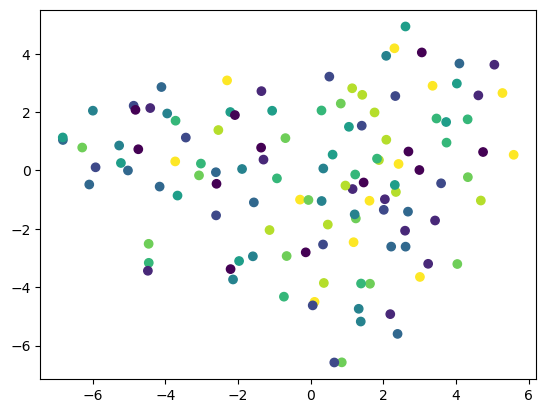

In [39]:
X_scl = StandardScaler().fit_transform(fmri_betas)
res = PCA(n_components=100,random_state=100).fit_transform(X_scl)
tem = TSNE(n_components = 2, learning_rate = 'auto').fit_transform(res)
plt.scatter(res[:,0], res[:,1], c=lcode)
plt.scatter(tem[:,0], tem[:,1], c=lcode)

Processing...DP20


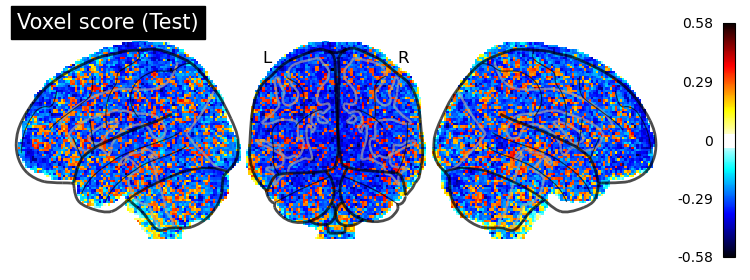

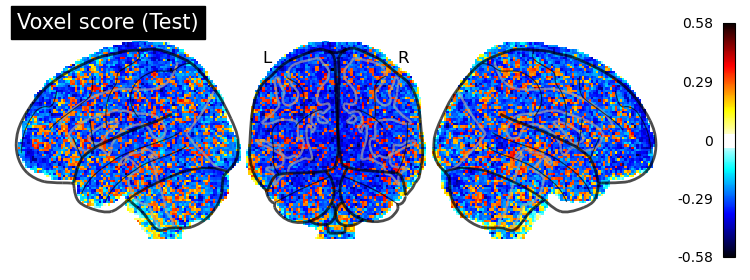

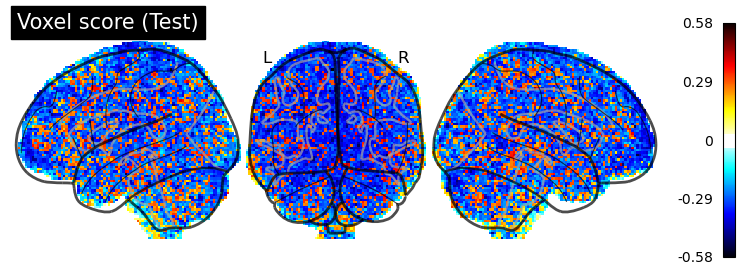

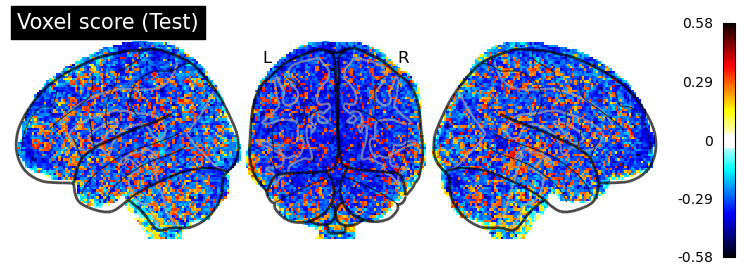

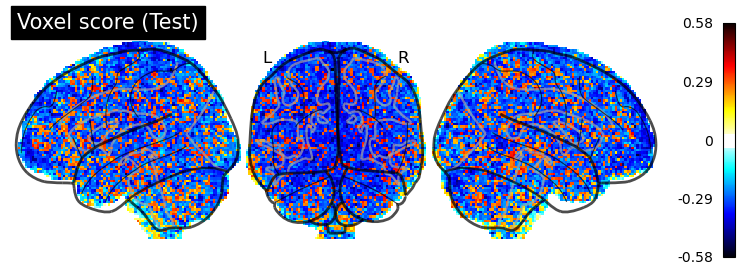

...

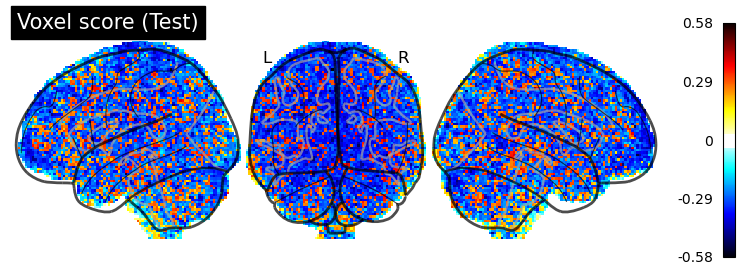

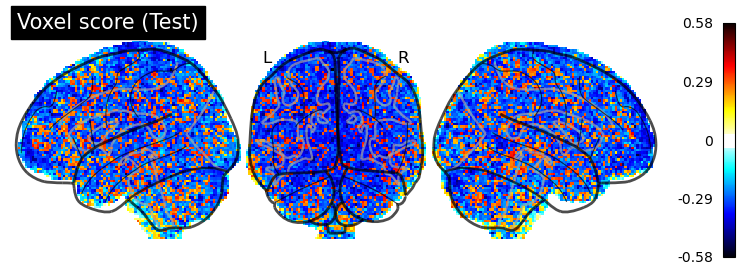

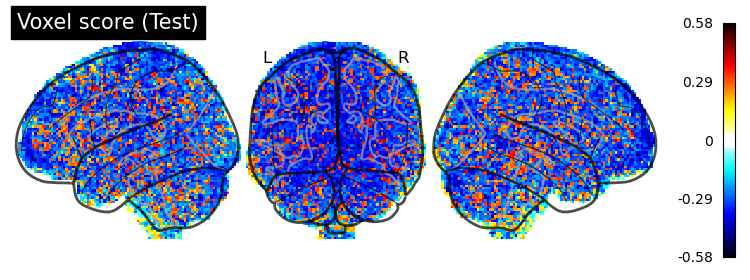

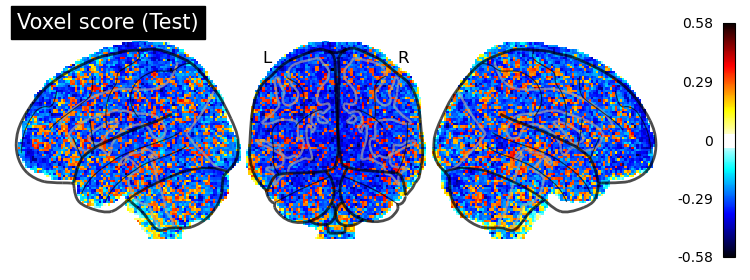

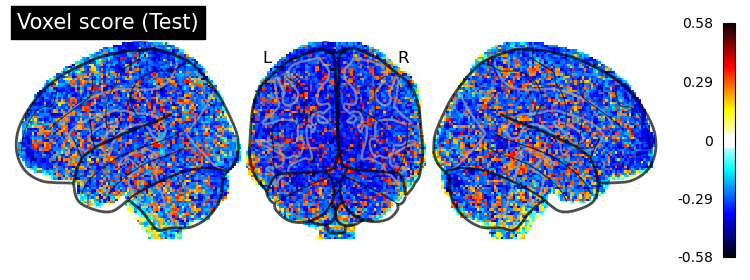

Processing...DP21


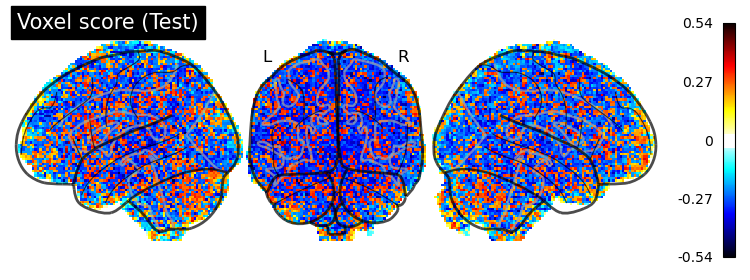

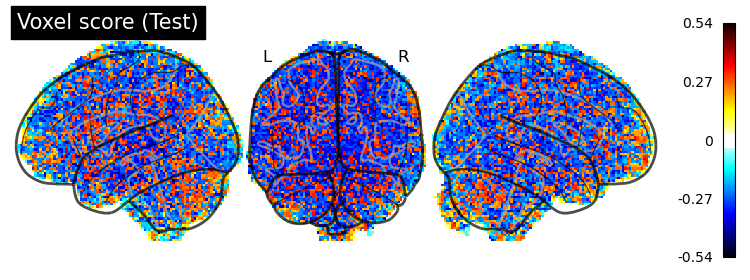

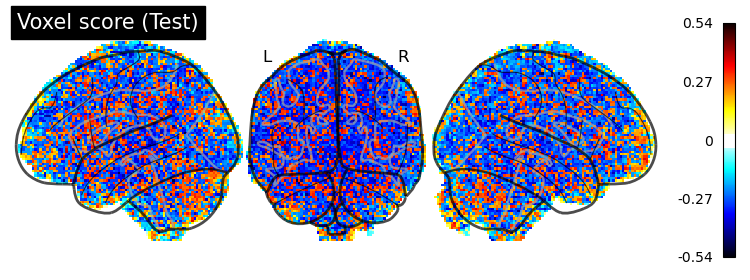

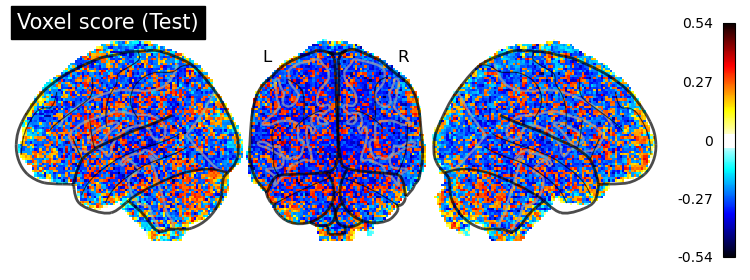

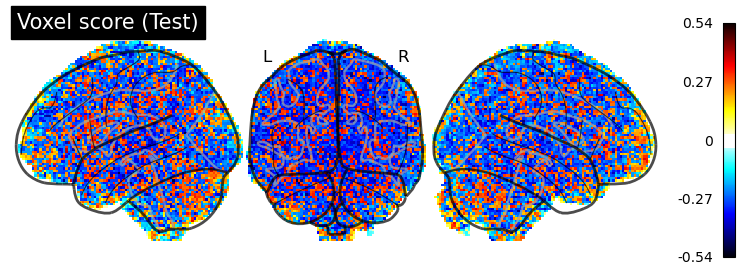

...

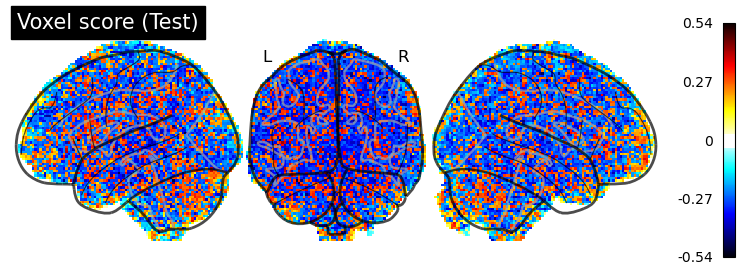

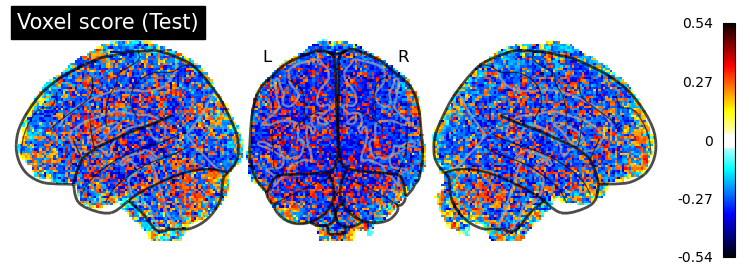

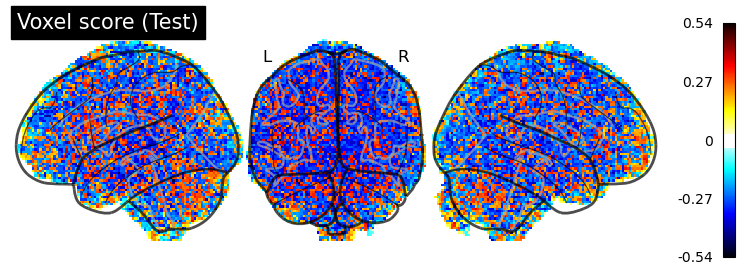

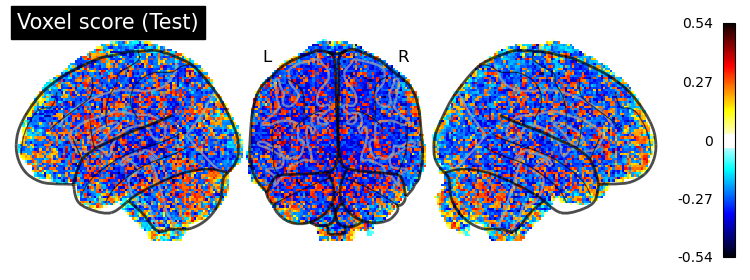

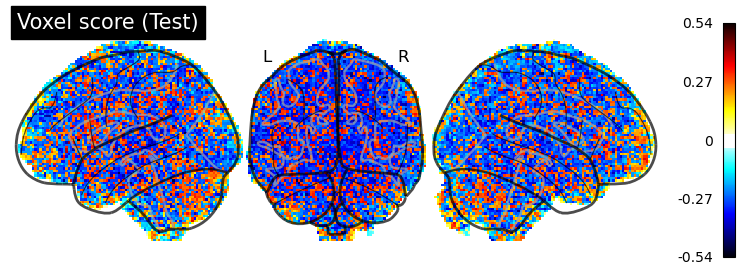

Processing...DP22


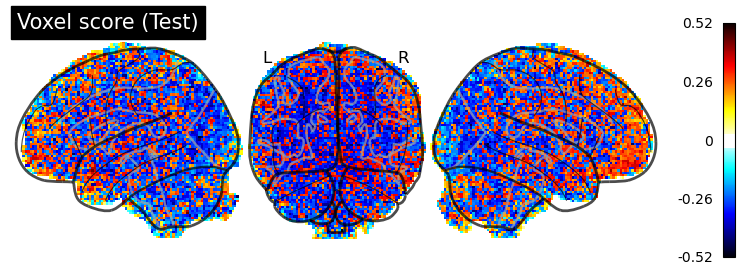

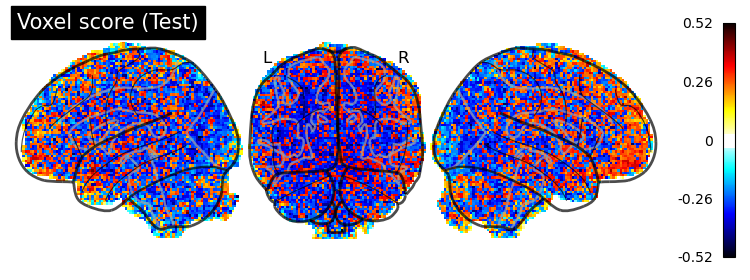

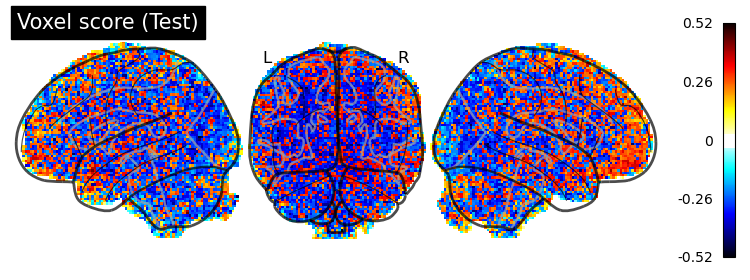

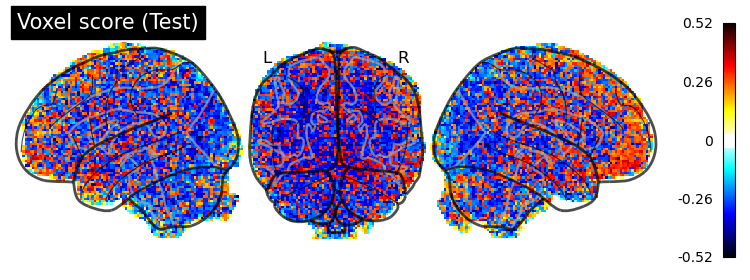

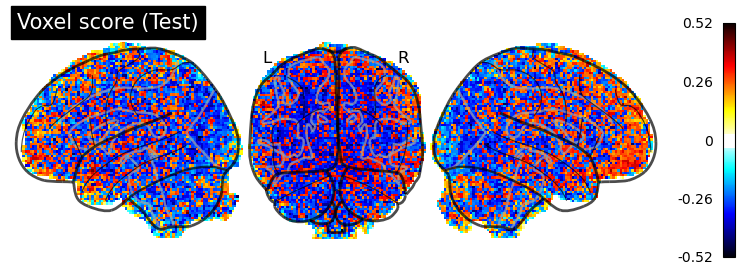

...

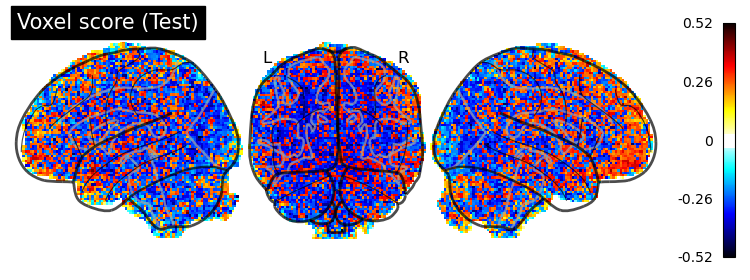

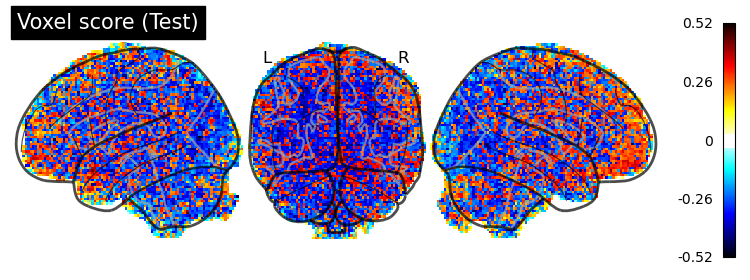

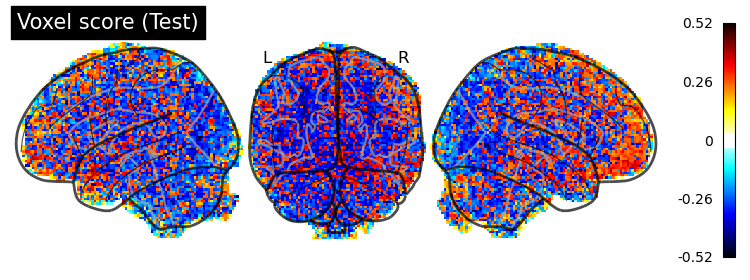

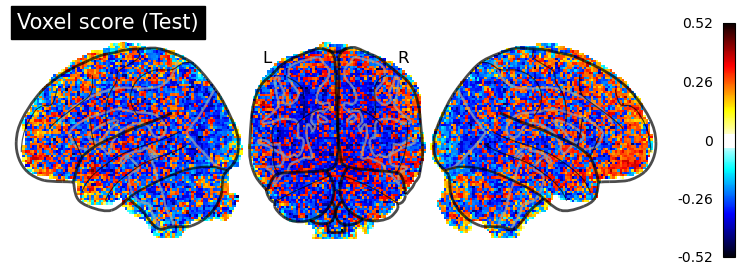

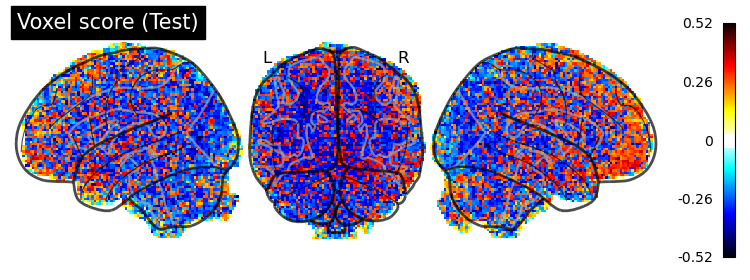

In [496]:
subj_list = ['20220801_DP01_mri', '20220801_DP02_mri', '20220802_DP03_mri', '20220802_DP04_mri', '20220905_DP07_mri', 
            '20220905_DP08_mri', '20220913_DP11_mri', '20220913_DP12_mri', '20221004_DP13_mri', '20221004_DP14_mri', 
            '20221011_DP15_mri', '20221017_DP16_mri', '20221017_DP17_mri', '20221107_DP18_mri', '20221108_DP19_mri', 
            '20221108_DP20_mri', '20230109_DP21_mri', '20230110_DP22_mri'] 
subj_list = ['20221108_DP20_mri', '20230109_DP21_mri', '20230110_DP22_mri']  
            # 20230214_DP23_mri, 20230221_DP24_mri, 20230228_DP25_mri]
#fname = '/mnt/sdb2/DeepDraw/Projects/20220801_DP01_mri/mri/output/beta/base_beta_run_2.nii'
# data = np.load(fname, allow_pickle=True)
proj_dir = '/mnt/sdb2/DeepDraw/Projects/'
fname_list = ['/mnt/sdb2/DeepDraw/Projects/20220801_DP01_mri/mri/output/beta/lsa_beta_run_1.nii',
              '/mnt/sdb2/DeepDraw/Projects/20220801_DP01_mri/mri/output/beta/lsa_beta_run_2.nii',
              '/mnt/sdb2/DeepDraw/Projects/20220801_DP01_mri/mri/output/beta/lsa_beta_run_3.nii']
maskname = '/mnt/sdb2/DeepDraw/Projects/20220801_DP01_mri/mri/output/preprocessed/full_mask.20220801_DP01_mri.nii.gz'
maskdir = '/mnt/sdb2/DeepDraw/mri_mask/Fan280'
cond_list =  ['/mnt/sdb2/DeepDraw/Projects/20220801_DP01_mri/Stimulus/20220801_DP01_mri_run1_stimulus.csv',
              '/mnt/sdb2/DeepDraw/Projects/20220801_DP01_mri/Stimulus/20220801_DP01_mri_run2_stimulus.csv',
              '/mnt/sdb2/DeepDraw/Projects/20220801_DP01_mri/Stimulus/20220801_DP01_mri_run3_stimulus.csv']


for subj in subj_list:
#     print(len(glob.glob(proj_dir + subj + '/mri/output/beta/lss_beta_run_*.nii')
#     print(len(glob.glob(proj_dir + subj + '/Stimulus/output/*csv')
    ID = subj.split('_')[1]
    fmri_betas, mask_data = prepare_fmridata(subj)
    letter_code = prepare_conds(subj)
    print('Processing...' + ID)
    for layer in layers:
        scores = []
        for n_pc in [50, 100]:
            reg = LinearRegression()
            temp = pca_letter[layer].transform(resp_org[layer])[:,:n_pc]
            desX = temp[letter_code]

            kf = KFold(n_splits=3)
            kf.get_n_splits(desX)

            for train_index, test_index in kf.split(desX):
                train_X, test_X = desX[train_index], desX[test_index]
                train_y, test_y = fmri_betas[train_index], fmri_betas[test_index]
                reg.fit(train_X, train_y)
                pred_y = reg.predict(test_X)
                scores.append(vectorized_correlation(test_y, pred_y))
            score_avg = np.stack(scores).mean(axis=0)
            visualize_score(score_avg, mask_data,'./Encoding_fMRI/resnet18/' + ID + '_' + layer + '_score' + str(n_pc))


In [495]:
subj

'20221108_DP20_mri'

In [ ]:
alphabet = set(string.ascii_letters)

a = [letter for letter in a if isinstance(letter, str) and letter.isalpha() and letter in alphabet]


In [451]:
resp_org['pixel'] = X.view(X.shape[0],-1)



In [452]:
resp_org['pixel'].shape

torch.Size([10, 150528])

In [469]:
layer = 'pixel'
resp_org['pixel'] = X.view(X.shape[0],-1).cpu()

reg = LinearRegression()
temp = pca_letter[layer].transform(resp_org[layer])[:,:200]
desX = temp[letter_code]
reg.fit(desX[:100,:], fmri_betas[:100,:])
fmri_pred = reg.predict(desX[100:,:])

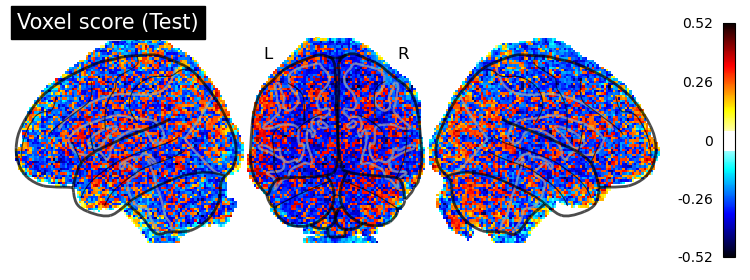

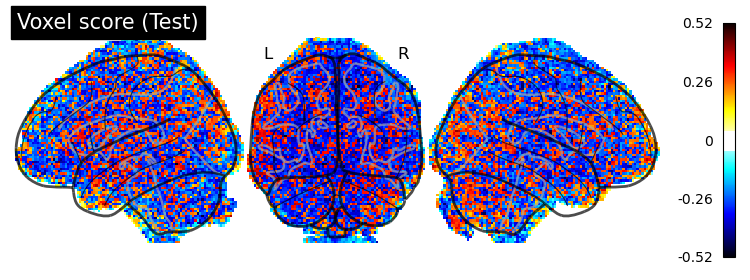

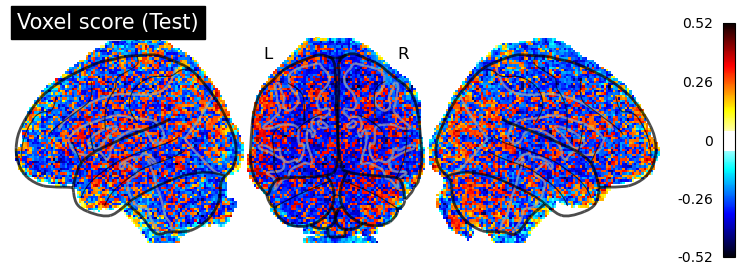

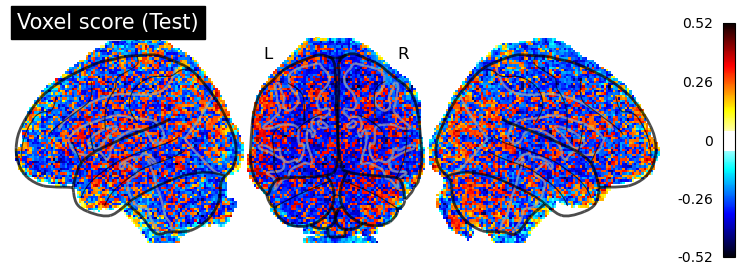

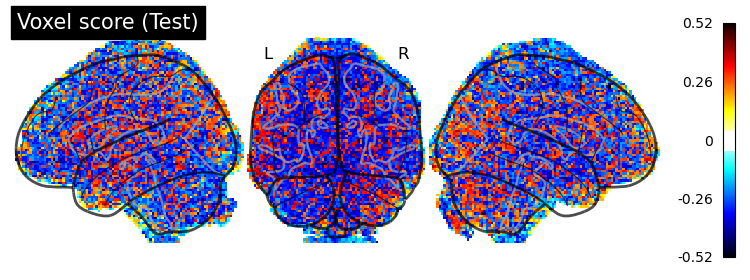

...

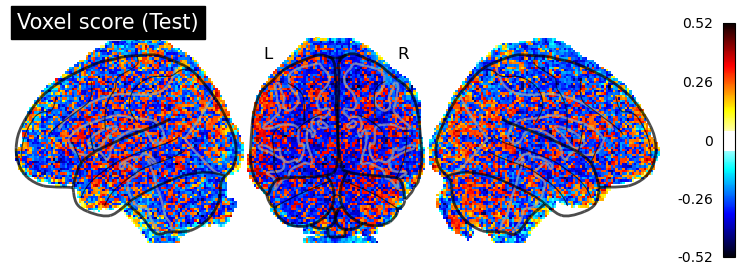

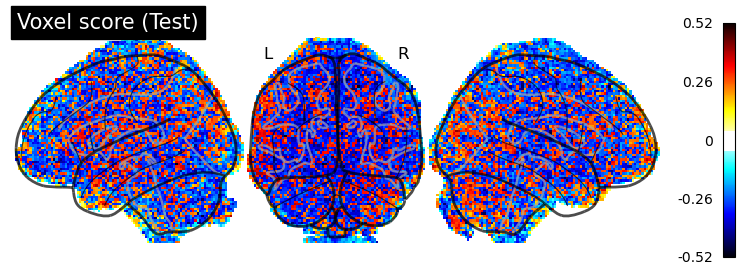

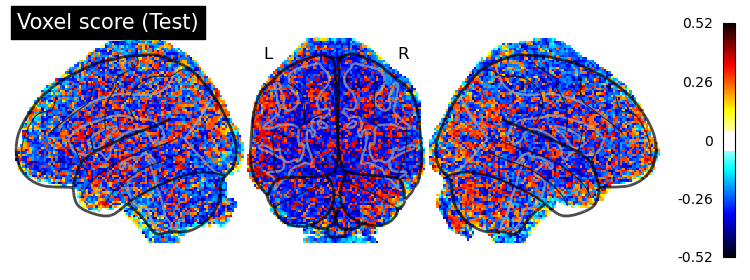

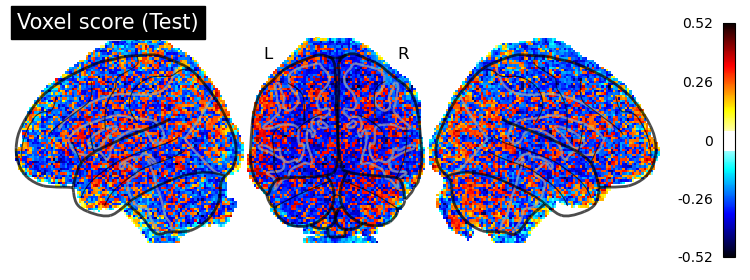

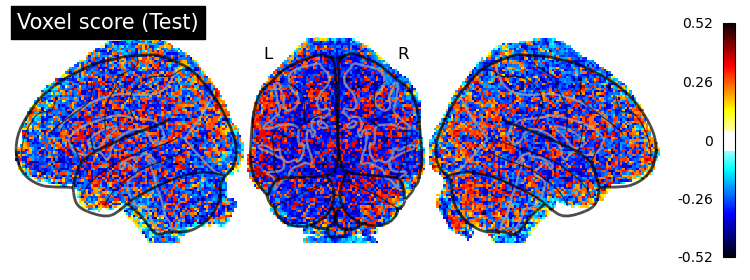

In [473]:
for layer in layers:
    scores = []
    for n_pc in [10, 20, 30, 40]:
        reg = LinearRegression()
        temp = pca_letter[layer].transform(resp_org[layer])[:,:n_pc]
        desX = temp[letter_code]

        kf = KFold(n_splits=3)
        kf.get_n_splits(desX)

        for train_index, test_index in kf.split(desX):
            train_X, test_X = desX[train_index], desX[test_index]
            train_y, test_y = fmri_betas[train_index], fmri_betas[test_index]
            reg.fit(train_X, train_y)
            pred_y = reg.predict(test_X)
            scores.append(vectorized_correlation(test_y, pred_y))
        score_avg = np.stack(scores).mean(axis=0)
        visualize_score(score_avg,mask_data,layer+'_score' + str(n_pc))
        

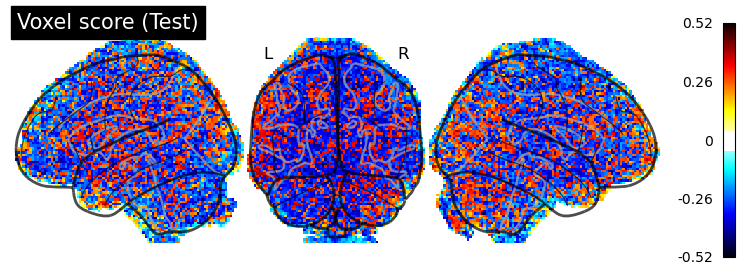

In [398]:
fmri_pred.shape

(20, 285259)

(array([   94.,  1720., 11624., 36414., 68706., 81551., 58956., 22319.,
         3648.,   227.]),
 array([-0.52032985, -0.42280154, -0.32527324, -0.22774493, -0.13021663,
        -0.03268832,  0.06483998,  0.16236829,  0.25989659,  0.3574249 ,
         0.45495321]),
 <BarContainer object of 10 artists>)

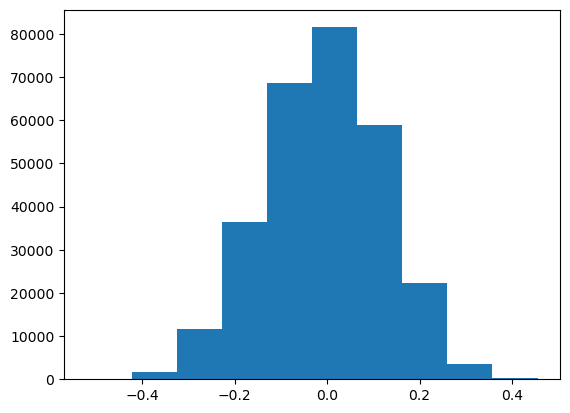

In [468]:
plt.hist(score_avg)

In [388]:
desX.shape, fmri_betas.T.shape

((120, 50), (120, 285259))

In [412]:
#scores = cross_val_score(LinearRegression(),desX, fmri_betas.T, cv=3)
reg = LinearRegression()
my_scorer = make_scorer(pearson_corr)
# Use cross-validation with the custom scorer
scores = cross_val_score(reg, desX, fmri_betas.T, cv=3, scoring=my_scorer)


/home/sungshinkim/.local/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/sungshinkim/.local/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/sungshinkim/.local/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "/home/sungshinkim/.local/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/tmp/ipykernel_973433/2259888019.py", line 19, in pearson_corr
    corr, _ = pearsonr(y_true, y_pred)
  File "/home/sungshinkim/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py", line 4463, in pearso

/home/sungshinkim/anaconda3/envs/seojin/lib/python3.9/site-packages/matplotlib/axes/_axes.py:6731: RuntimeWarning: All-NaN slice encountered
  xmin = min(xmin, np.nanmin(xi))
/home/sungshinkim/anaconda3/envs/seojin/lib/python3.9/site-packages/matplotlib/axes/_axes.py:6732: RuntimeWarning: All-NaN slice encountered
  xmax = max(xmax, np.nanmax(xi))


ValueError: autodetected range of [nan, nan] is not finite

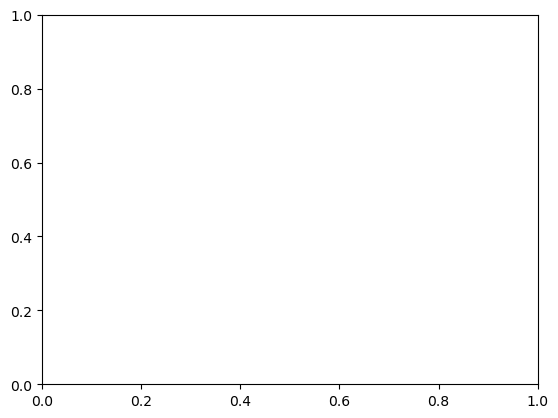

In [413]:
plt.hist(scores)

In [404]:
score= vectorized_correlation(fmri_pred,fmri_betas.T[100:,:])

In [406]:
fmri_pred.shape

(20, 285259)

In [347]:
layer = 'layer1'
reg = LinearRegression(pen)

for layer in resnet18_layers:
    temp = pca_letter[layer].transform(resp_org[layer])
    desX = temp[letter_code]
    fmri_pred = reg.fit_transform(desX, fmri_betas.T)
    
    

AttributeError: 'str' object has no attribute 'shape'

In [350]:
fea = temp[letter_code]

In [352]:
fea.shape, fmri_betas.shape

((120, 200), (285259, 120))

In [325]:
fmri_betas.shape

(285259, 120)

In [282]:
len(pca_letter['pixel'].explained_variance_)

200

In [285]:
temp.shape

(10, 200)

In [348]:
for layer in layers:
    temp = pca_letter[layer].transform(resp_org[layer])

KeyError: 'pixel'

In [257]:
data.shape

(285259, 40)

In [248]:
data.shape, type(data), data.sum()

((96, 114, 96, 40), numpy.memmap, 20423932.049266554)

In [249]:
data.reshape(-1,40).shape

(1050624, 40)

In [242]:
data.shape, type(data)

((96, 114, 96, 40), nibabel.nifti1.Nifti1Image)

In [216]:
!ls /mnt/sdb2/DeepDraw/Projects/20220801_DP01_mri/mri/output/beta/

base_beta_conditions_run1_behavCut.npy	base_residual_run_2
base_beta_conditions_run1.npy		base_residual_run_2_behavCut
base_beta_conditions_run2_behavCut.npy	base_residual_run_3
base_beta_conditions_run2.npy		base_residual_run_3_behavCut
base_beta_conditions_run3_behavCut.npy	glm
base_beta_conditions_run3.npy		lsa_beta_conditions.npy
base_beta_run_1_behavCut.nii		lsa_beta_run_1.nii
base_beta_run_1.nii			lsa_beta_run_2.nii
base_beta_run_2_behavCut.nii		lsa_beta_run_3.nii
base_beta_run_2.nii			lss_beta_conditions.npy
base_beta_run_3_behavCut.nii		lss_beta_run_1.nii
base_beta_run_3.nii			lss_beta_run_2.nii
base_residual_run_1			lss_beta_run_3.nii
base_residual_run_1_behavCut


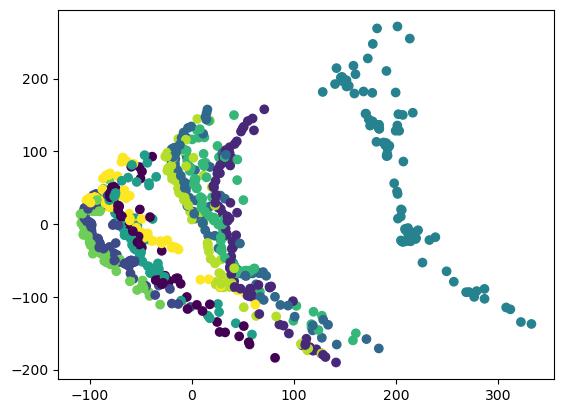

In [86]:
plt.scatter(X_pc['layer2'][:,0],X_pc['layer2'][:,1], c=ya[:1000])

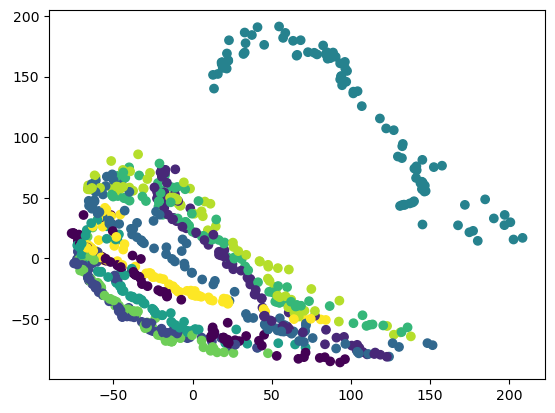

In [87]:
plt.scatter(X_pc['layer3'][:,0],X_pc['layer3'][:,1], c=ya[:1000])

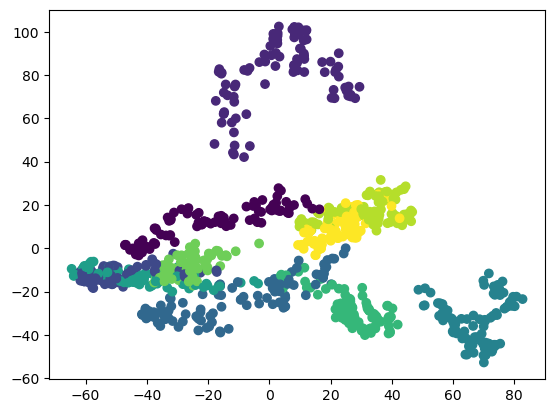

In [88]:
plt.scatter(X_pc['layer4'][:,0],X_pc['layer4'][:,1], c=ya[:1000])

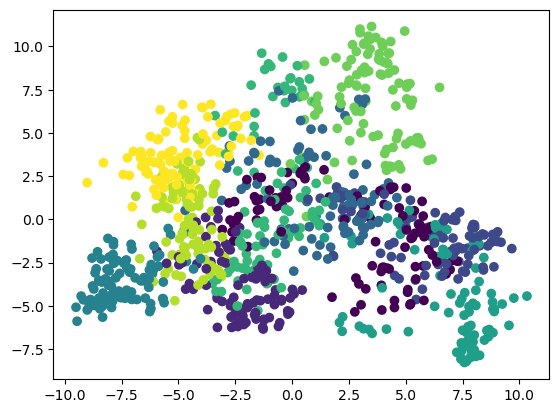

In [113]:
plt.scatter(X_pc['avgpool'][:,0],X_pc['avgpool'][:,1], c=ya[:1000])

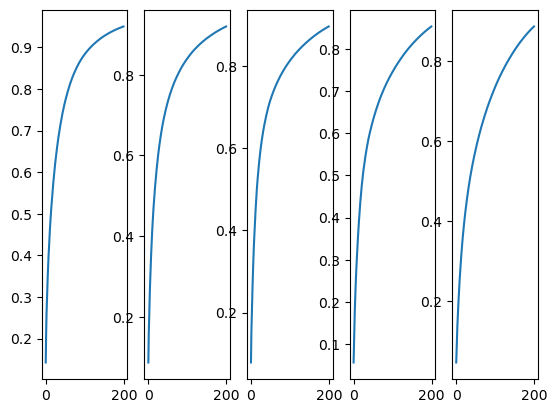

In [90]:
X_em = {}
for k, layer in enumerate(resnet18_layers):
    X_em[layer] = TSNE(n_components=2,learning_rate='auto').fit_transform(X_pc[layer])

/home/sungshinkim/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/sungshinkim/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/sungshinkim/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/sungshinkim/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/sungshinkim/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


In [95]:
X_em['layer1'].shape

(1000, 2)

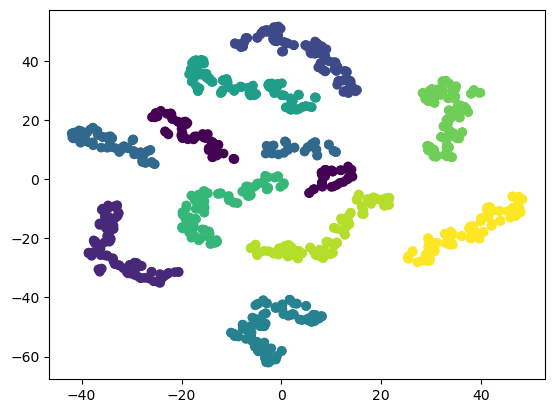

In [108]:
layer = 'avgpool'
plt.scatter(X_em[layer][:,0],X_em[layer][:,1],c=ya[:1000])

In [206]:
model.fc.in_features

512

In [207]:
model = copy.deepcopy(models['resnet18'])
for param in model.parameters():
    param.requires_grad = False

# num_ftrs = model.classifier[0].in_features
# model.classifier = nn.Linear(num_ftrs, 10)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 10)
model.to(DEVICE)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
loss_fn = nn.CrossEntropyLoss()


100%|██████████| 500/500 [17:50<00:00,  2.14s/it]


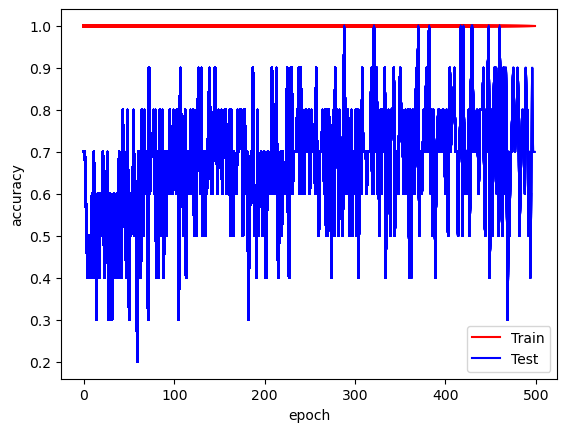

In [210]:
acc_trn = []
acc_test = []

for epoch in tqdm(range(1000)):
    loss_sum=0
    total_trn=0
    total_test = 0
    correct_trn=0
    correct_test=0
    for images, labels in train_loader:
        images = images.to(DEVICE)
        labels = labels.to(DEVICE)

        optimizer.zero_grad()
        output = model(images)
        loss = loss_fn(output, labels)
        loss.backward()
        optimizer.step()
        correct_trn += torch.sum(torch.argmax(output, dim=1)==labels)
        total_trn += len(output)
    with torch.no_grad():

        for images, labels in test_loader:
            images=images.to(DEVICE)
            labels=labels.to(DEVICE)
            output = model(images)
            loss = loss_fn(output, labels)
            loss_sum += loss.item()
            predictions = torch.argmax(output, dim=1)
            total_test += len(output)
            correct_test += torch.sum(predictions==labels)
    acc_trn.append(correct_trn.cpu()/total_trn)
    acc_test.append(correct_test.cpu()/total_test)
    if epoch
torch.save(model.state_dict(), './resnet18_letter')

    plt.plot(acc_trn, c='r')
    plt.plot(acc_test, c='b')
    plt.xlabel('epoch')
    plt.ylabel('accuracy')
    plt.legend(['Train','Test'])


In [212]:
torch.save(model.state_dict(), './resnet18_letter')


In [445]:
model, loss, acc = train(vgg19_new, optimizer, train_loader, loss_fn, DEVICE)

100%|██████████| 10/10 [00:08<00:00,  1.17it/s]


In [438]:
DEVICE

'cuda'

In [442]:
images.shape

torch.Size([5, 3, 224, 224])

In [446]:
total = 0
correct = 0
for images, labels in test_loader:
    images.to(DEVICE)
    labels.to(DEVICE)
    model.eval()
    output = model(images)
    predictions = torch.argmax(output, dim=1)
    total += len(output)
    correct += torch.sum(predictions==labels)
    accuracy.append(correct/total)


RuntimeError: Input type (torch.FloatTensor) and weight type (torch.cuda.FloatTensor) should be the same or input should be a MKLDNN tensor and weight is a dense tensor

In [429]:
model()

tensor(0.0649, device='cuda:0', grad_fn=<NllLossBackward0>)

In [154]:
extractor = tx.Extractor(models['vgg19'], models['vgg19'].named_modules())
extractor = tx.Extractor(models['vgg19'],[])



In [171]:
model_outputs = models['vgg19'](input_imgs)
model_outputindex = torch.nn.functional.softmax(model_outputs, dim=1)

In [173]:
model_outputindex.shape

torch.Size([10, 1000])

In [160]:
input_imgs.shape

torch.Size([10, 3, 224, 224])

In [161]:
model_outputs.shape

torch.Size([10, 1000])

In [159]:
torch.topk()

torch.Size([10, 1000])

In [164]:
import urllib
url, filename = ("https://github.com/pytorch/hub/raw/master/images/dog.jpg", "dog.jpg")
try: urllib.URLopener().retrieve(url, filename)
except: urllib.request.urlretrieve(url, filename)
from PIL import Image
from torchvision import transforms
input_image = Image.open(filename)
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_tensor = preprocess(input_image)
input_batch = input_tensor.unsqueeze(0) # create a mini-batch as expected by the model

model = models['vgg19']
model.eval()
# move the input and model to GPU for speed if available
if torch.cuda.is_available():
    input_batch = input_batch.to('cuda')
    model.to('cuda')

with torch.no_grad():
    output = model(input_batch)

In [166]:
input_batch.shape, output.shape

(torch.Size([1, 3, 224, 224]), torch.Size([1, 1000]))

In [145]:
print(models['vgg19'])

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

In [115]:
model_output, features = extractor(input_imgs)

In [119]:
model_output.shape

torch.Size([10, 1000])

In [126]:
{name: f.shape for name, f in features.items()}

{'layer1': torch.Size([10, 64, 56, 56]),
 'layer2': torch.Size([10, 128, 28, 28])}

In [122]:
features['layer1'].shape, features['layer2'].shape

(torch.Size([10, 64, 56, 56]), torch.Size([10, 128, 28, 28]))

In [110]:
for letter_file in tqdm(letter_paths):
    input_img = resize_normalize(PIL.Image.open(letter_file))
    for model_name, model in models.items()
    tx.Extractor(model, ['layer1','layer2'])

AttributeError: 'Tensor' object has no attribute 'newaxis'

In [108]:
extractor(img)

ValueError: expected 4D input (got 3D input)

SyntaxError: invalid syntax (2542358765.py, line 3)

In [141]:
for name, module in models['resnet18'].named_modules():
    print(name)


conv1
bn1
relu
maxpool
layer1
layer1.0
layer1.0.conv1
layer1.0.bn1
layer1.0.relu
layer1.0.conv2
layer1.0.bn2
layer1.1
layer1.1.conv1
layer1.1.bn1
layer1.1.relu
layer1.1.conv2
layer1.1.bn2
layer2
layer2.0
layer2.0.conv1
layer2.0.bn1
layer2.0.relu
layer2.0.conv2
layer2.0.bn2
layer2.0.downsample
layer2.0.downsample.0
layer2.0.downsample.1
layer2.1
layer2.1.conv1
layer2.1.bn1
layer2.1.relu
layer2.1.conv2
layer2.1.bn2
layer3
layer3.0
layer3.0.conv1
layer3.0.bn1
layer3.0.relu
layer3.0.conv2
layer3.0.bn2
layer3.0.downsample
layer3.0.downsample.0
layer3.0.downsample.1
layer3.1
layer3.1.conv1
layer3.1.bn1
layer3.1.relu
layer3.1.conv2
layer3.1.bn2
layer4
layer4.0
layer4.0.conv1
layer4.0.bn1
layer4.0.relu
layer4.0.conv2
layer4.0.bn2
layer4.0.downsample
layer4.0.downsample.0
layer4.0.downsample.1
layer4.1
layer4.1.conv1
layer4.1.bn1
layer4.1.relu
layer4.1.conv2
layer4.1.bn2
avgpool
fc


In [105]:
tx.list_module_names(models['resnet18'])

''

In [72]:
models['resnet50']

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

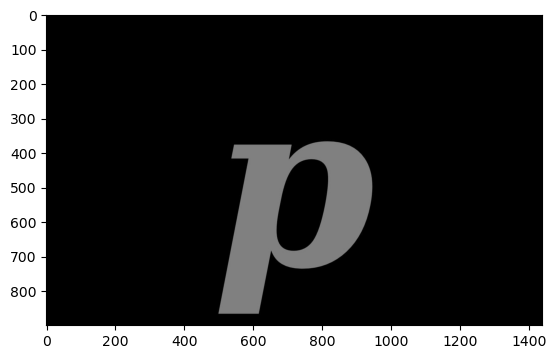

In [55]:
plt.imshow(b)

In [32]:
a = image.imread(letter_list[0])
type(a)

numpy.ndarray

In [36]:
b = PIL.Image.open(letter_list[0])
type(b)

PIL.JpegImagePlugin.JpegImageFile

In [38]:
img = resize_normalize(b)
type(img)

torch.Tensor

In [65]:
img.mean(axis=0).shape

torch.Size([224, 224])

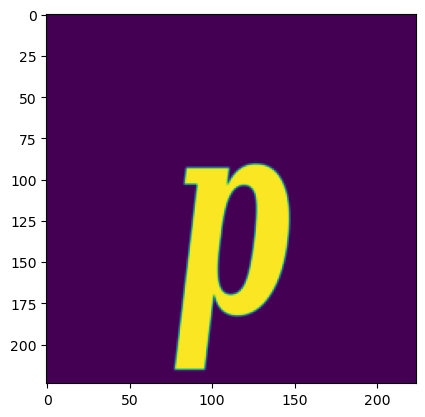

In [66]:
plt.imshow(img.mean(axis=0))

In [50]:
img = resize_normalize(b).squeeze()
type(img)
img.shape, resize_normalize(b).shape

(torch.Size([3, 224, 224]), torch.Size([3, 224, 224]))

In [45]:
tem = unsqueeze(0)

TypeError: pic should be PIL Image or ndarray. Got <class 'torch.Tensor'>